In [ ]:
import pandas as pd
import numpy as np

from scipy import stats

from sklearn.preprocessing import MinMaxScaler

import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import skew, kurtosis

from sklearn.preprocessing import LabelEncoder

from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from scipy.stats import uniform

from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score


In [ ]:
# Load the marketing dataset
df = pd.read_csv('marketing_data.csv')

df.shape

(2240, 28)

In [ ]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Country
0,1826,1970,Graduation,Divorced,84835.0,0,0,2014-06-16,0,189,...,6,1,0,0,0,0,0,1,0,Spain
1,1,1961,Graduation,Single,57091.0,0,0,2014-06-15,0,464,...,7,5,0,0,0,0,1,1,0,Canada
2,10476,1958,Graduation,Married,67267.0,0,1,2014-05-13,0,134,...,5,2,0,0,0,0,0,0,0,USA
3,1386,1967,Graduation,Together,32474.0,1,1,2014-05-11,0,10,...,2,7,0,0,0,0,0,0,0,Australia
4,5371,1989,Graduation,Single,21474.0,1,0,2014-04-08,0,6,...,2,7,1,0,0,0,0,1,0,Spain
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10142,1976,PhD,Divorced,66476.0,0,1,2013-03-07,99,372,...,11,4,0,0,0,0,0,0,0,USA
2236,5263,1977,2n Cycle,Married,31056.0,1,0,2013-01-22,99,5,...,3,8,0,0,0,0,0,0,0,Spain
2237,22,1976,Graduation,Divorced,46310.0,1,0,2012-12-03,99,185,...,5,8,0,0,0,0,0,0,0,Spain
2238,528,1978,Graduation,Married,65819.0,0,0,2012-11-29,99,267,...,10,3,0,0,0,0,0,0,0,India


In [ ]:
# Handling Missing Values
# Identify columns with missing values
missing_cols = df.columns[df.isnull().any()]

# Check the percentage of missing values in each column
missing_percentage = df[missing_cols].isnull().mean() * 100

# Fill missing numerical values with the median and categorical values with the mode.
for col in missing_cols:
    if df[col].dtype == 'object':
        df[col].fillna(df[col].mode()[0], inplace=True)
    else:
        df[col].fillna(df[col].median(), inplace=True)

# Handling Duplicates
# Remove duplicate rows if they exist
df.drop_duplicates(inplace=True)

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2240 entries, 0 to 2239
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4    Income              2240 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [ ]:
# Print all column names
column_names = df.columns
print("Column Names:")
for col in column_names:
    print(col)


Column Names:
ID
Year_Birth
Education
Marital_Status
 Income 
Kidhome
Teenhome
Dt_Customer
Recency
MntWines
MntFruits
MntMeatProducts
MntFishProducts
MntSweetProducts
MntGoldProds
NumDealsPurchases
NumWebPurchases
NumCatalogPurchases
NumStorePurchases
NumWebVisitsMonth
AcceptedCmp3
AcceptedCmp4
AcceptedCmp5
AcceptedCmp1
AcceptedCmp2
Response
Complain
Country


In [ ]:
# Remove leading space from column names
df.columns = df.columns.str.strip()

# Print the DataFrame with corrected column names
df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 2240 entries, 0 to 2239
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2240 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

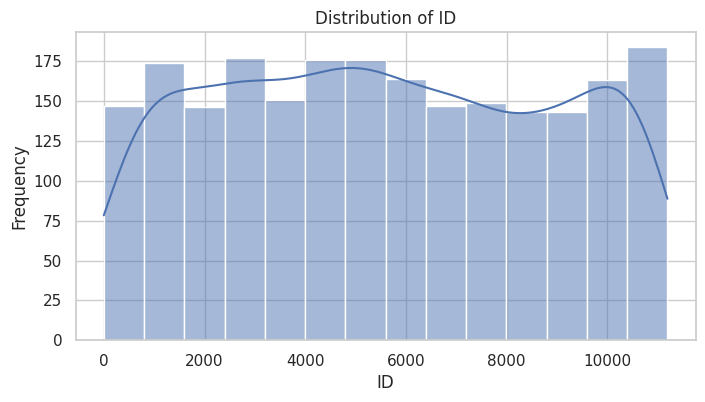

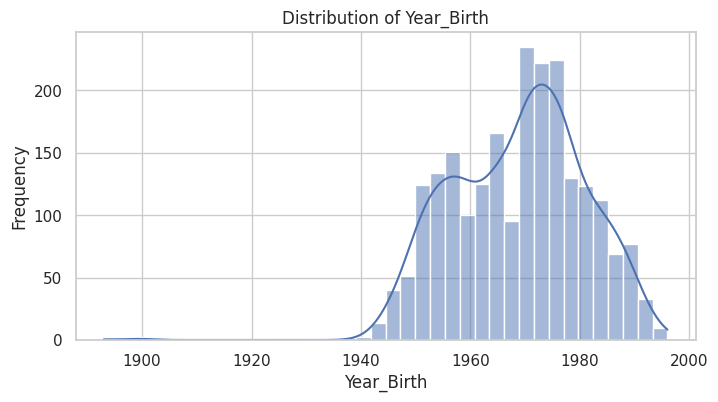

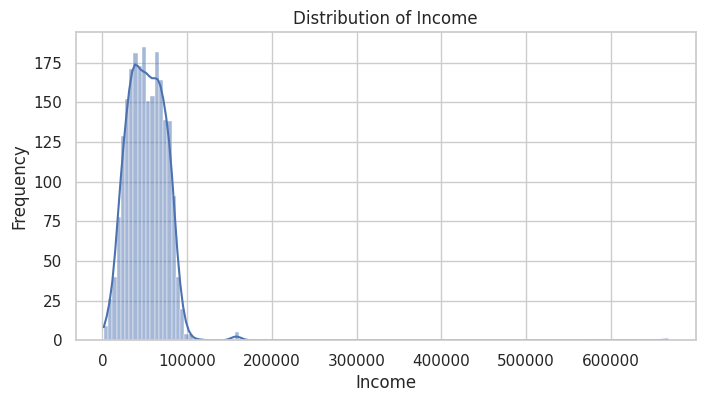

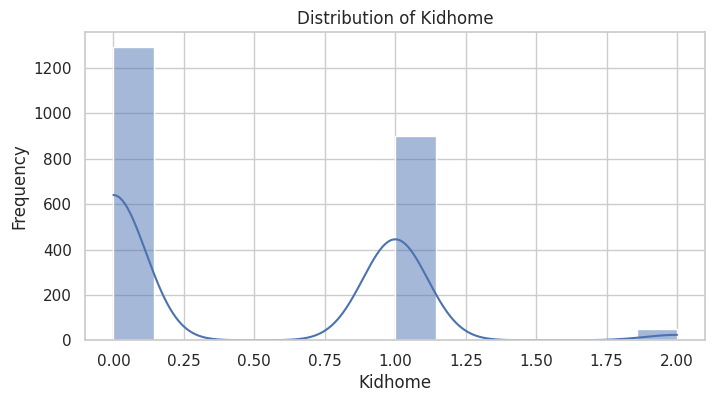

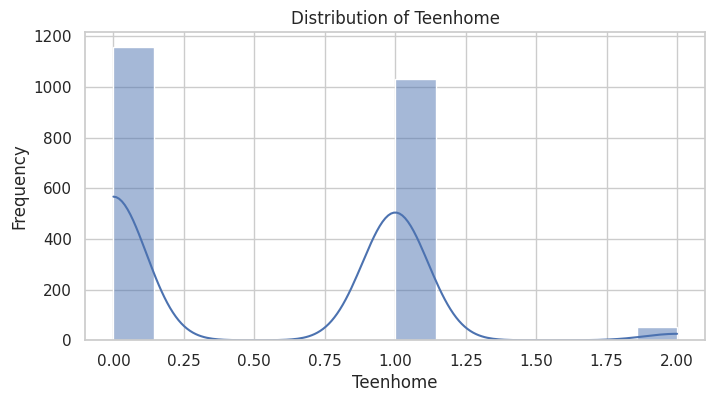

...

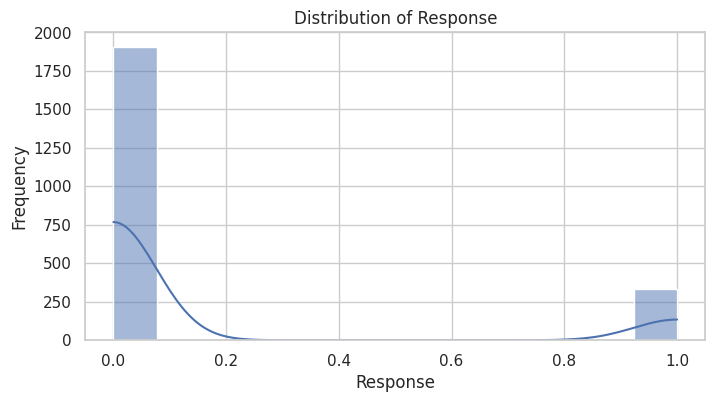

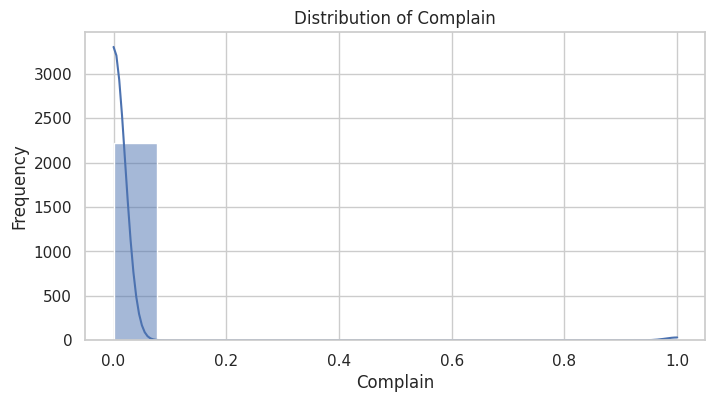

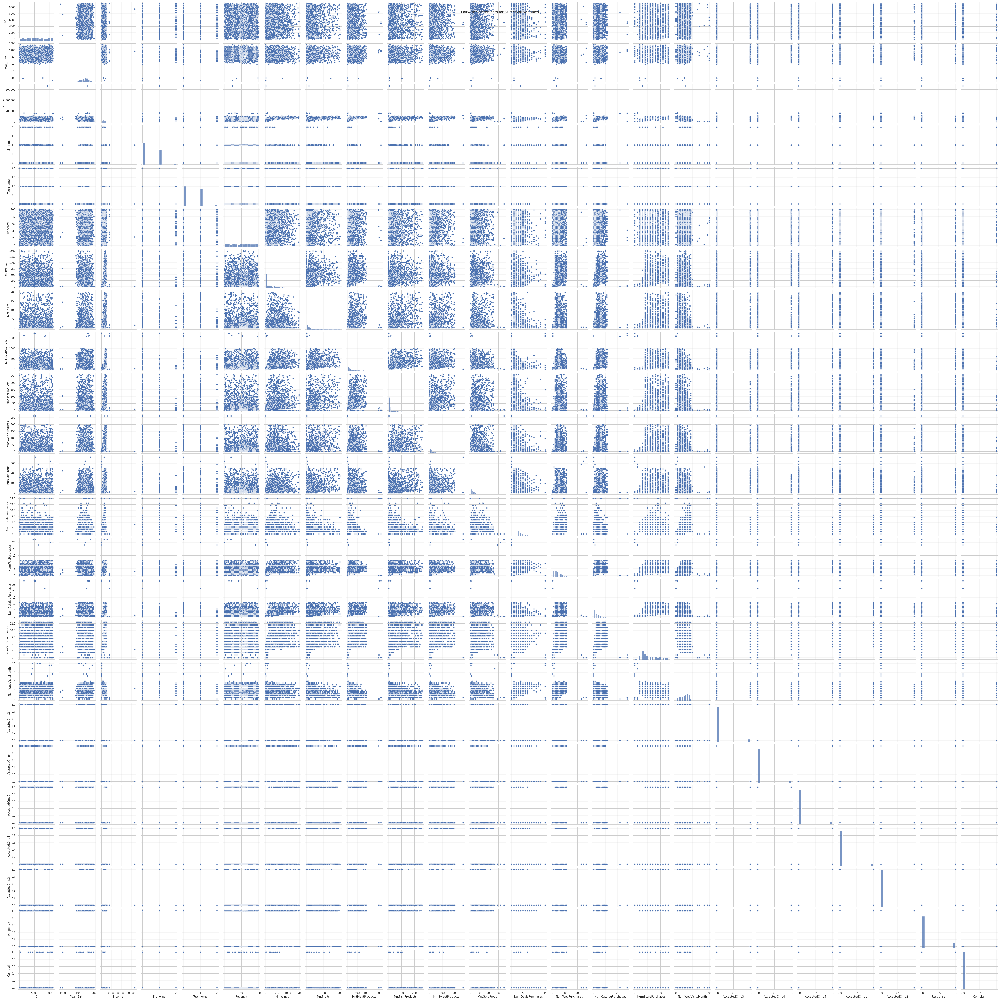

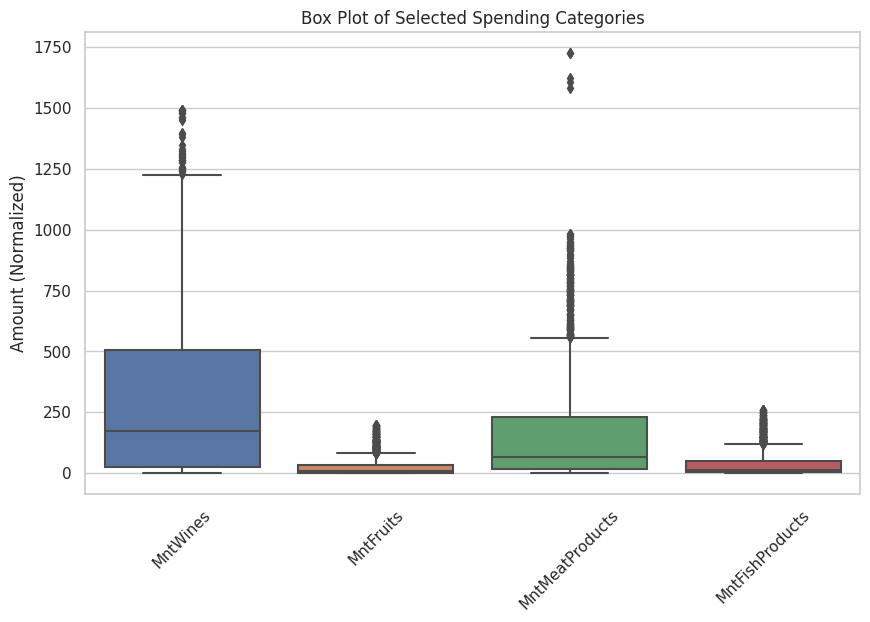

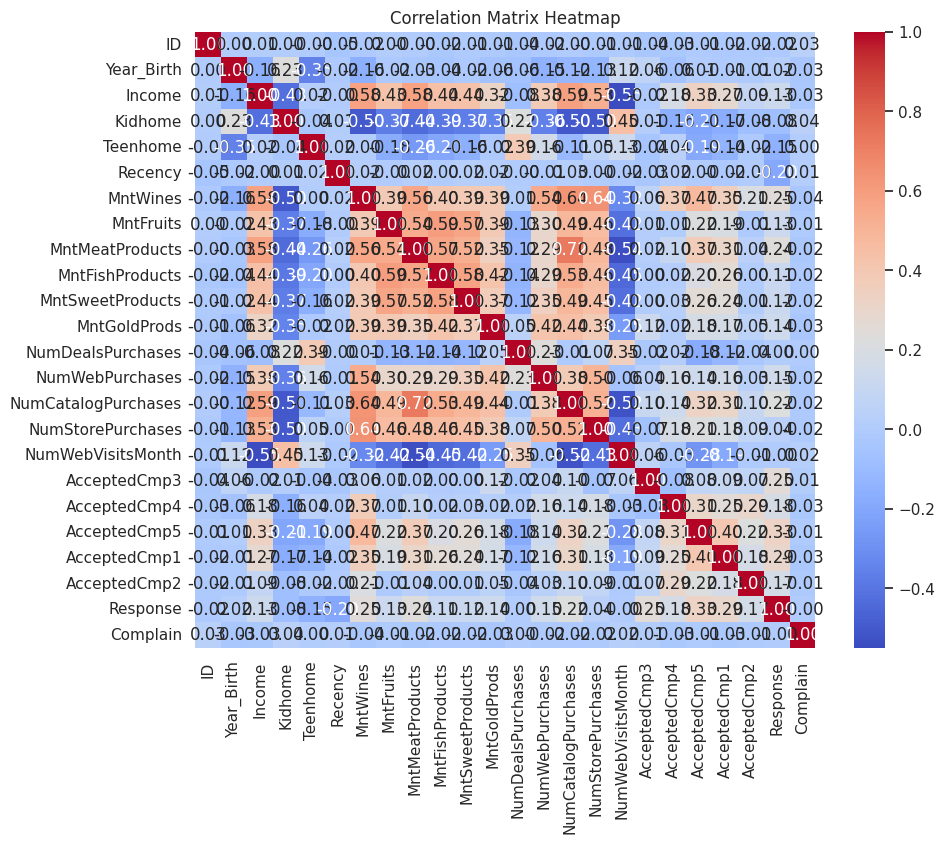

In [ ]:
# Set the style for Seaborn plots
sns.set(style="whitegrid")

# Histograms for numerical variables
numerical_cols = df.select_dtypes(include=[np.number]).columns.tolist()
for col in numerical_cols:
    plt.figure(figsize=(8, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

# Scatter plots to visualize relationships between numerical variables
sns.pairplot(df[numerical_cols])
plt.suptitle('Pairwise Scatter Plots for Numerical Variables')
plt.show()

# Box plots for selected variables
selected_boxplot_cols = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts']
plt.figure(figsize=(10, 6))
sns.boxplot(data=df[selected_boxplot_cols])
plt.title('Box Plot of Selected Spending Categories')
plt.ylabel('Amount (Normalized)')
plt.xticks(rotation=45)
plt.show()

# Correlation matrix and heatmap
correlation_matrix = df[numerical_cols].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix Heatmap')
plt.show()


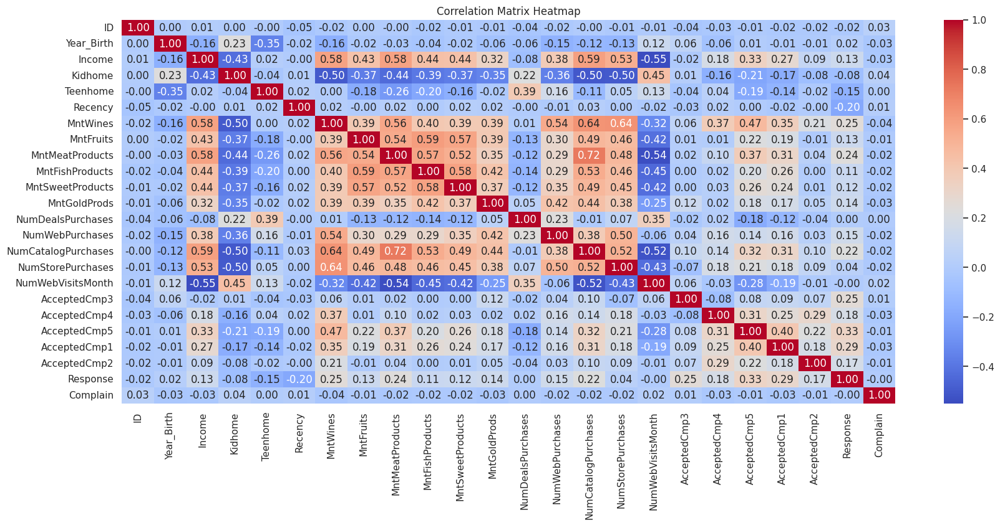

In [ ]:
plt.figure(figsize=(20, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix Heatmap')
plt.show()


<ipython-input-22-fd67d7d7f117>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  summary_stats = summary_stats.append(median_values, ignore_index=True)
<ipython-input-22-fd67d7d7f117>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  summary_stats = summary_stats.append(skewness_values, ignore_index=True)
<ipython-input-22-fd67d7d7f117>:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  summary_stats = summary_stats.append(kurtosis_values, ignore_index=True)


Summary Statistics:
                    ID   Year_Birth         Income      Kidhome     Teenhome  \
count      2240.000000  2240.000000    2240.000000  2240.000000  2240.000000   
mean       5592.159821  1968.805804   52237.975446     0.444196     0.506250   
std        3246.662198    11.984069   25037.955891     0.538398     0.544538   
min           0.000000  1893.000000    1730.000000     0.000000     0.000000   
25%        2828.250000  1959.000000   35538.750000     0.000000     0.000000   
50%        5458.500000  1970.000000   51381.500000     0.000000     0.000000   
75%        8427.750000  1977.000000   68289.750000     1.000000     1.000000   
max       11191.000000  1996.000000  666666.000000     2.000000     2.000000   
median     5458.500000  1970.000000   51381.500000     0.000000     0.000000   
skewness      0.039805    -0.349709       6.796392     0.634863     0.406842   
kurtosis     -1.190051     0.713187     161.037424    -0.780600    -0.986712   

              Recen

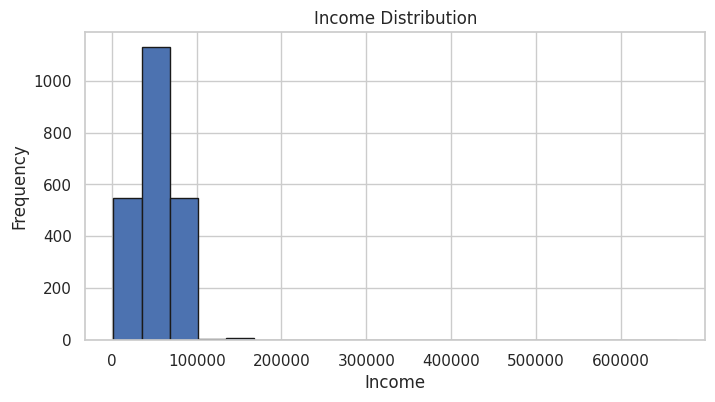

Skewness Values:
ID                      0.039805
Year_Birth             -0.349709
Income                  6.796392
Kidhome                 0.634863
Teenhome                0.406842
Recency                -0.001985
MntWines                1.174983
MntFruits               2.100655
MntMeatProducts         2.081838
MntFishProducts         1.918483
MntSweetProducts        2.134650
MntGoldProds            1.884842
NumDealsPurchases       2.416950
NumWebPurchases         1.381868
NumCatalogPurchases     1.879729
NumStorePurchases       0.701767
NumWebVisitsMonth       0.207786
AcceptedCmp3            3.289500
AcceptedCmp4            3.239403
AcceptedCmp5            3.289500
AcceptedCmp1            3.553063
AcceptedCmp2            8.466418
Response                1.970234
Complain               10.182148
dtype: float64

Kurtosis Values:
ID                      -1.190051
Year_Birth               0.713187
Income                 161.037424
Kidhome                 -0.780600
Teenhome              

In [ ]:
# Filter the DataFrame to include only numeric columns
numeric_df = df.select_dtypes(include=['number'])

# Calculate summary statistics
summary_stats = numeric_df.describe()

# Calculate additional statistics, such as median, skewness, and kurtosis
median_values = numeric_df.median()
skewness_values = numeric_df.apply(skew)
kurtosis_values = numeric_df.apply(kurtosis)

# Combine the summary statistics with additional measures
summary_stats = summary_stats.append(median_values, ignore_index=True)
summary_stats = summary_stats.append(skewness_values, ignore_index=True)
summary_stats = summary_stats.append(kurtosis_values, ignore_index=True)
summary_stats.index = summary_stats.index.map({0: 'count', 1: 'mean', 2: 'std', 3: 'min', 4: '25%', 5: '50%', 6: '75%', 7: 'max', 8: 'median', 9: 'skewness', 10: 'kurtosis'})

# Print the summary statistics
print("Summary Statistics:")
print(summary_stats)

# Explore data distributions
plt.figure(figsize=(8, 4))
plt.hist(numeric_df['Income'], bins=20, edgecolor='k')
plt.title('Income Distribution')
plt.xlabel('Income')
plt.ylabel('Frequency')
plt.show()

# Assess skewness and kurtosis
print("Skewness Values:")
print(skewness_values)
print("\nKurtosis Values:")
print(kurtosis_values)


In [ ]:
# List of column names to check for unique values
columns_to_check = ['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2']

# Check unique values in each specified column
for column_name in columns_to_check:
    unique_values = df[column_name].unique()
    print(f"Unique values in '{column_name}':")
    print(unique_values)
    print("\n")


Unique values in 'AcceptedCmp3':
[0 1]


Unique values in 'AcceptedCmp4':
[0 1]


Unique values in 'AcceptedCmp5':
[0 1]


Unique values in 'AcceptedCmp1':
[0 1]


Unique values in 'AcceptedCmp2':
[0 1]




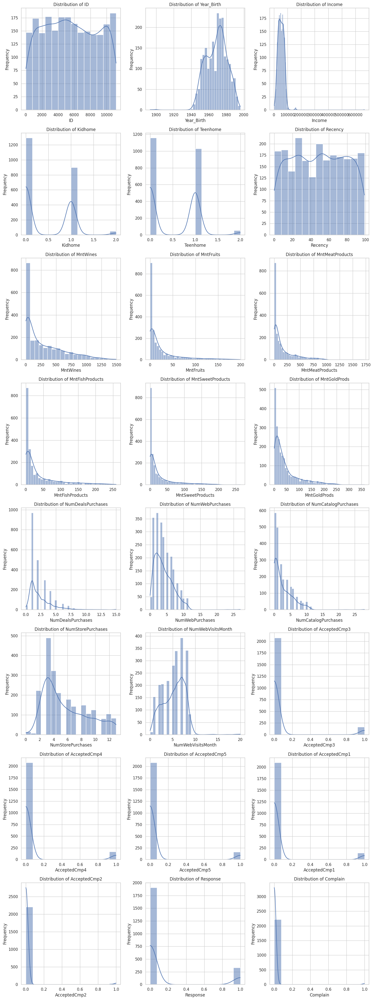

In [ ]:
# Select only the numerical columns for visualization
numerical_cols = df.select_dtypes(include=[np.number]).columns.tolist()

# Create a grid of histograms for numerical columns
num_cols_count = len(numerical_cols)
num_rows = (num_cols_count // 3) + (num_cols_count % 3)  # 3 histograms per row

plt.figure(figsize=(15, 5 * num_rows))
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(num_rows, 3, i)
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

# Adjust subplot layout
plt.tight_layout()
plt.show()


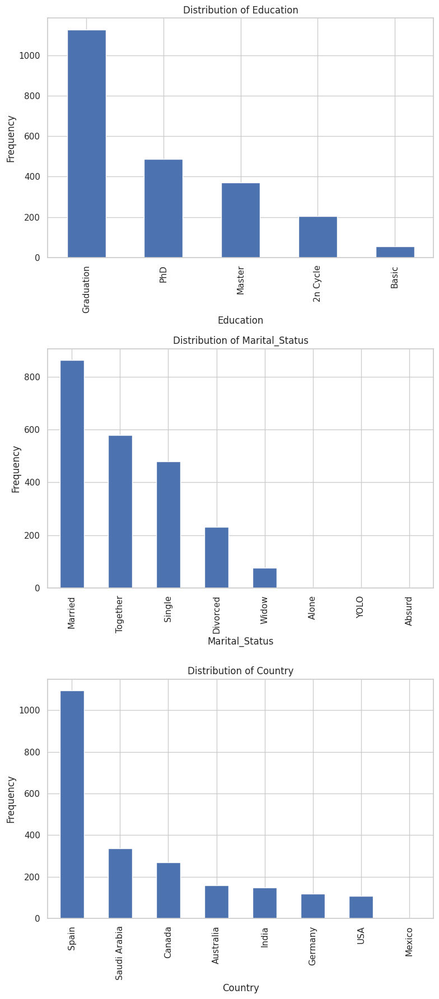

In [ ]:
# Standardize Data Formats (e.g., Date Format)
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'])

# Identify categorical columns
categorical_columns = df.select_dtypes(include=['object']).columns

# Create subplots for each categorical column
fig, axes = plt.subplots(nrows=len(categorical_columns), ncols=1, figsize=(8, 6 * len(categorical_columns)))

# Iterate through categorical columns and create bar plots
for i, column_name in enumerate(categorical_columns):
    ax = axes[i]
    category_counts = df[column_name].value_counts()
    category_counts.plot(kind='bar', ax=ax)
    ax.set_title(f'Distribution of {column_name}')
    ax.set_xlabel(column_name)
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.show()


In [ ]:
# What is the distribution of customers' education levels (Education)?
education_distribution = df['Education'].value_counts()

# What is the most common marital status (Marital_Status) among the customers?
most_common_marital_status = df['Marital_Status'].mode()[0]

# What is the income distribution (Income) of Maven Marketing's customers?
income_distribution = df['Income']

# How many customers have children (Kidhome) and teenagers (Teenhome) in their households?
customers_with_children = len(df[df['Kidhome'] > 0])
customers_with_teenagers = len(df[df['Teenhome'] > 0])


# Define the cutoff date as December 31, 2014
cutoff_date = pd.to_datetime('2014-12-31')

# How long on average have customers been enrolled with the company (Dt_Customer)?
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'])
average_enrollment_duration = (pd.to_datetime('now') - df['Dt_Customer']).mean()

# Print the results
print("Distribution of Education Levels:")
print(education_distribution)
print("\nMost Common Marital Status:")
print(most_common_marital_status)
print("\nIncome Distribution:")
print(income_distribution)
print("\nNumber of Customers with Children:")
print(customers_with_children)
print("\nNumber of Customers with Teenagers:")
print(customers_with_teenagers)
print("\nAverage Enrollment Duration (in years):")
print(average_enrollment_duration.days / 365)


Distribution of Education Levels:
Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: Education, dtype: int64

Most Common Marital Status:
Married

Income Distribution:
0       84835.0
1       57091.0
2       67267.0
3       32474.0
4       21474.0
         ...   
2235    66476.0
2236    31056.0
2237    46310.0
2238    65819.0
2239    94871.0
Name: Income, Length: 2240, dtype: float64

Number of Customers with Children:
947

Number of Customers with Teenagers:
1082

Average Enrollment Duration (in years):
10.213698630136987


<ipython-input-27-f38860aa64a3>:15: FutureWarning: The parsing of 'now' in pd.to_datetime without `utc=True` is deprecated. In a future version, this will match Timestamp('now') and Timestamp.now()
  average_enrollment_duration = (pd.to_datetime('now') - df['Dt_Customer']).mean()


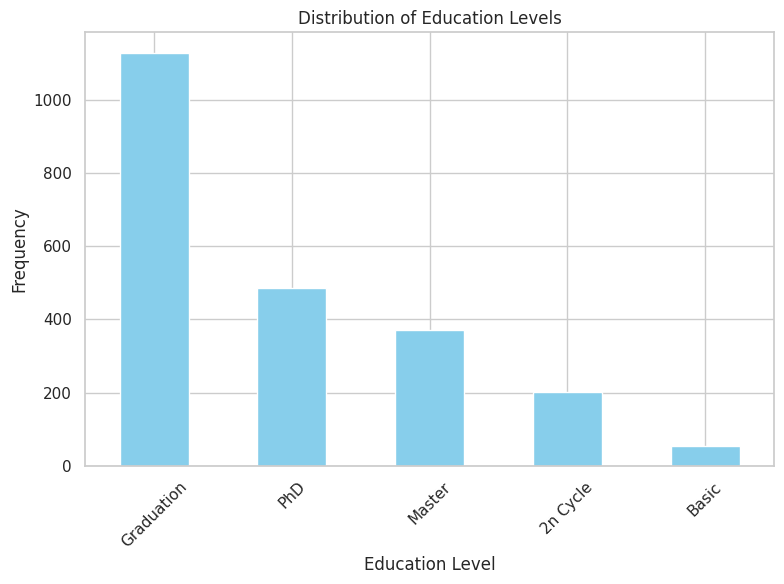

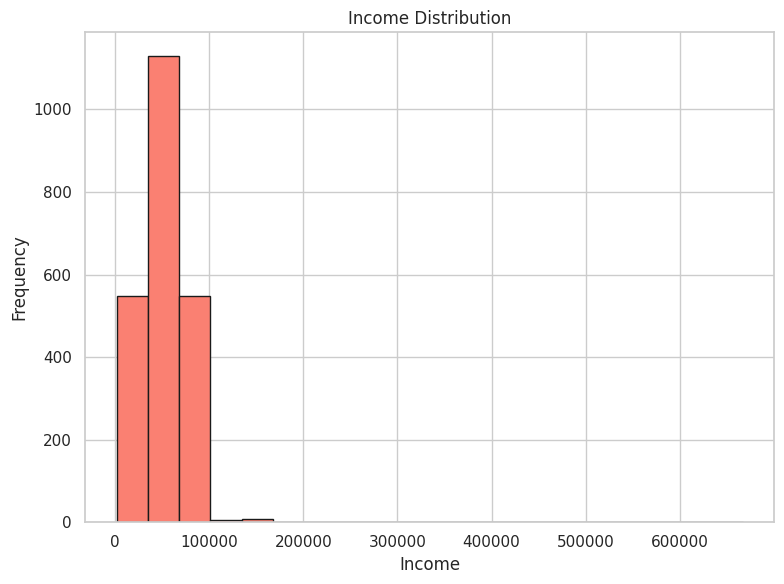

In [ ]:
# Plot the distribution of education levels
plt.figure(figsize=(8, 6))
education_distribution.plot(kind='bar', color='skyblue')
plt.title('Distribution of Education Levels')
plt.xlabel('Education Level')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.tight_layout()

# Plot the income distribution (you can customize the number of bins)
plt.figure(figsize=(8, 6))
plt.hist(income_distribution, bins=20, color='salmon', edgecolor='k')
plt.title('Income Distribution')
plt.xlabel('Income')
plt.ylabel('Frequency')
plt.tight_layout()

# Show the plots
plt.show()


In [ ]:
# Define a z-score threshold (e.g., values beyond 3 standard deviations)
z_score_threshold = 3

# Calculate the z-scores for the 'Income' column
z_scores = stats.zscore(df['Income'])

# Filter out rows where the z-score exceeds the threshold
df_no_outliers = df[(z_scores < z_score_threshold) & (z_scores > -z_score_threshold)]

# Print the number of rows before and after removing outliers
print(f"Number of rows before removing outliers: {len(df)}")
print(f"Number of rows after removing outliers: {len(df_no_outliers)}")




Number of rows before removing outliers: 2240
Number of rows after removing outliers: 2232


In [ ]:
# Save the cleaned DataFrame to a new file if needed
df_no_outliers.to_csv('cleaned_marketing_data_no_outliers.csv', index=False)

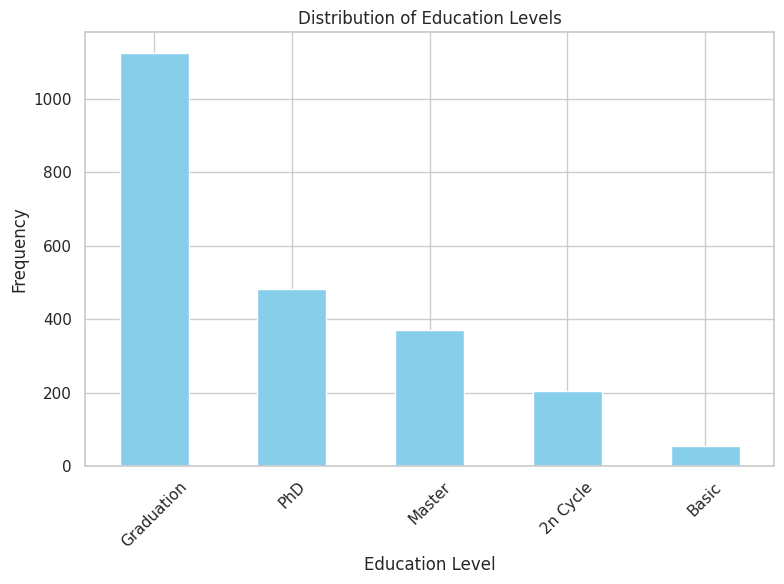

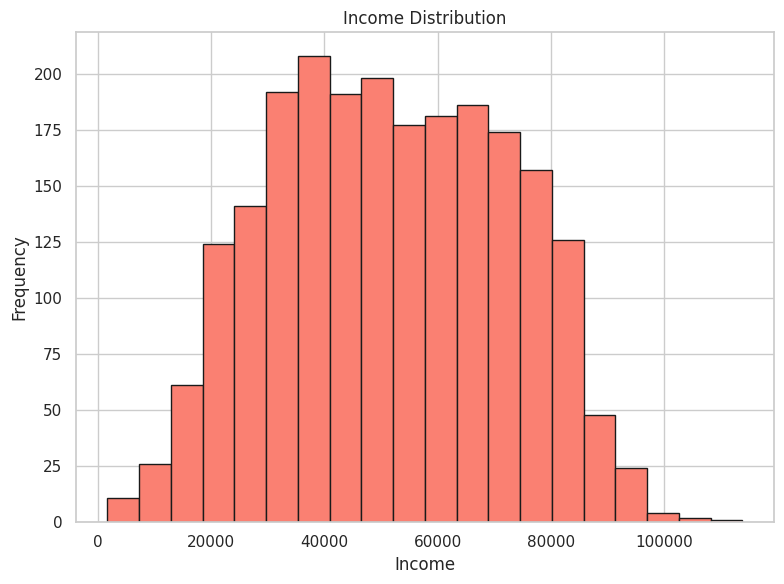

In [ ]:
# Load the cleaned dataset
df = pd.read_csv('cleaned_marketing_data_no_outliers.csv')

# What is the distribution of customers' education levels (Education)?
education_distribution = df['Education'].value_counts()

# What is the income distribution (Income) of Maven Marketing's customers?
income_distribution = df['Income']

# Plot the distribution of education levels
plt.figure(figsize=(8, 6))
education_distribution.plot(kind='bar', color='skyblue')
plt.title('Distribution of Education Levels')
plt.xlabel('Education Level')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.tight_layout()

# Plot the income distribution (you can customize the number of bins)
plt.figure(figsize=(8, 6))
plt.hist(income_distribution, bins=20, color='salmon', edgecolor='k')
plt.title('Income Distribution')
plt.xlabel('Income')
plt.ylabel('Frequency')
plt.tight_layout()

# Show the plots
plt.show()


Average Spending in Each Product Category (Last 2 Years):
MntWines            304.930108
MntFruits            26.380376
MntMeatProducts     165.319444
MntFishProducts      37.644713
MntSweetProducts     27.155466
MntGoldProds         44.166219
dtype: float64

Product Category with the Highest Average Spending:
MntWines: 304.93


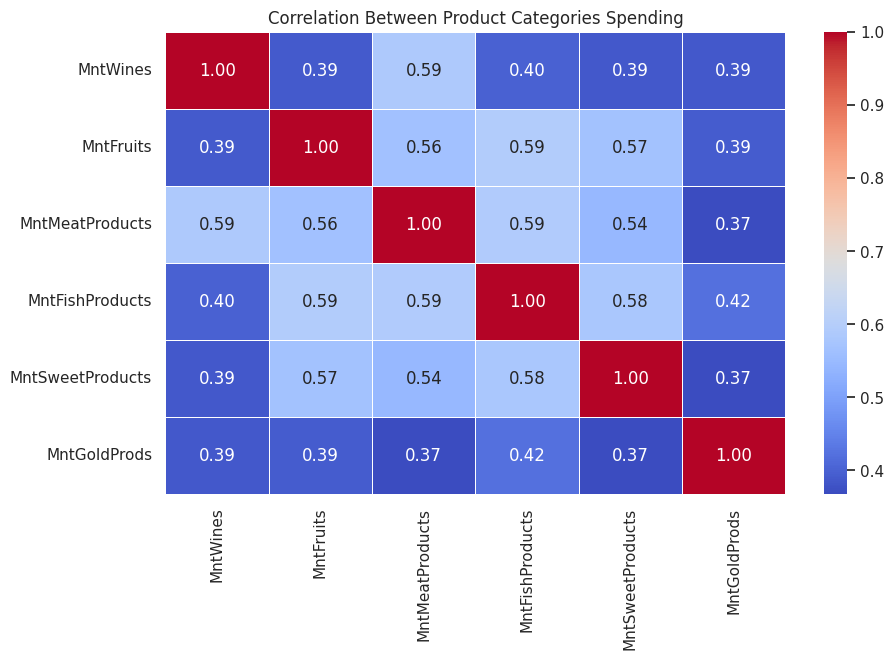

In [ ]:
# Calculate the average spending in each product category over the last 2 years
product_categories = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
average_spending = df[product_categories].mean()

# Find the product category with the highest average spending
highest_average_spending_category = average_spending.idxmax()
highest_average_spending_value = average_spending.max()

# Print the results
print("Average Spending in Each Product Category (Last 2 Years):")
print(average_spending)
print("\nProduct Category with the Highest Average Spending:")
print(f"{highest_average_spending_category}: {highest_average_spending_value:.2f}")

# Calculate correlations between spending in different product categories
correlation_matrix = df[product_categories].corr()

# Visualize the correlation matrix as a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Between Product Categories Spending')
plt.show()


In [ ]:
# What is the average number of purchases made with a discount (NumDealsPurchases)?
average_discount_purchases = df['NumDealsPurchases'].mean()

# How do customers prefer to make purchases?
# Calculate the average number of purchases through the website, catalogs, and physical stores
average_web_purchases = df['NumWebPurchases'].mean()
average_catalog_purchases = df['NumCatalogPurchases'].mean()
average_store_purchases = df['NumStorePurchases'].mean()

# Print the results
print("Average Number of Purchases Made with a Discount:")
print(f"{average_discount_purchases:.2f}")
print("\nAverage Number of Purchases Through Different Channels:")
print(f"Website: {average_web_purchases:.2f}")
print(f"Catalogs: {average_catalog_purchases:.2f}")
print(f"Physical Stores: {average_store_purchases:.2f}")


Average Number of Purchases Made with a Discount:
2.32

Average Number of Purchases Through Different Channels:
Website: 4.10
Catalogs: 2.64
Physical Stores: 5.81


Average Number of Web Visits in the Last Month:
5.33

Campaign Acceptance Rate for Different Numbers of Web Visits:
NumWebVisitsMonth
0     0.000000
1     0.200000
2     0.198020
3     0.160976
4     0.119266
5     0.088968
6     0.141593
7     0.114504
8     0.166667
9     0.349398
10    0.333333
13    0.000000
14    0.000000
17    0.000000
19    0.000000
20    0.000000
Name: Response, dtype: float64


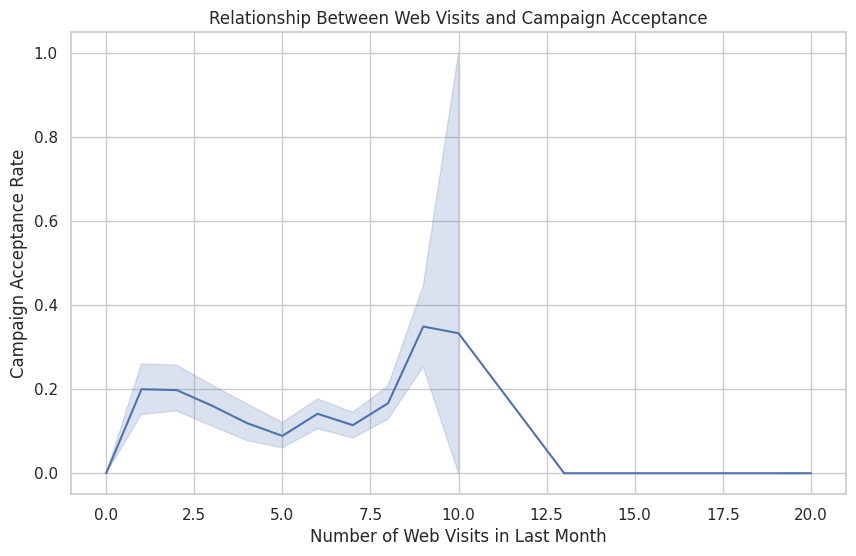

In [ ]:
# How frequently do customers visit the company's website in the last month (NumWebVisitsMonth)?
average_web_visits = df['NumWebVisitsMonth'].mean()

# Is there a relationship between the number of web visits and campaign acceptance?
# Calculate the average campaign acceptance rate for different numbers of web visits
web_visits_campaign_acceptance = df.groupby('NumWebVisitsMonth')['Response'].mean()

# Print the results
print("Average Number of Web Visits in the Last Month:")
print(f"{average_web_visits:.2f}")

print("\nCampaign Acceptance Rate for Different Numbers of Web Visits:")
print(web_visits_campaign_acceptance)

# Visualize the relationship between web visits and campaign acceptance
plt.figure(figsize=(10, 6))
sns.lineplot(x='NumWebVisitsMonth', y='Response', data=df)
plt.title('Relationship Between Web Visits and Campaign Acceptance')
plt.xlabel('Number of Web Visits in Last Month')
plt.ylabel('Campaign Acceptance Rate')
plt.show()


Overall Acceptance Rate for Each Marketing Campaign:
AcceptedCmp1    0.064516
AcceptedCmp2    0.013441
AcceptedCmp3    0.073029
AcceptedCmp4    0.074821
AcceptedCmp5    0.073029
dtype: float64

Acceptance Rates by Education Level:
            AcceptedCmp1  AcceptedCmp2  AcceptedCmp3  AcceptedCmp4  \
Education                                                            
2n Cycle        0.068966      0.009852      0.073892      0.049261   
Basic           0.000000      0.000000      0.111111      0.000000   
Graduation      0.072954      0.014235      0.069395      0.072064   
Master          0.048780      0.005420      0.065041      0.084011   
PhD             0.062241      0.020747      0.082988      0.093361   

            AcceptedCmp5  
Education                 
2n Cycle        0.049261  
Basic           0.000000  
Graduation      0.076512  
Master          0.075881  
PhD             0.080913  


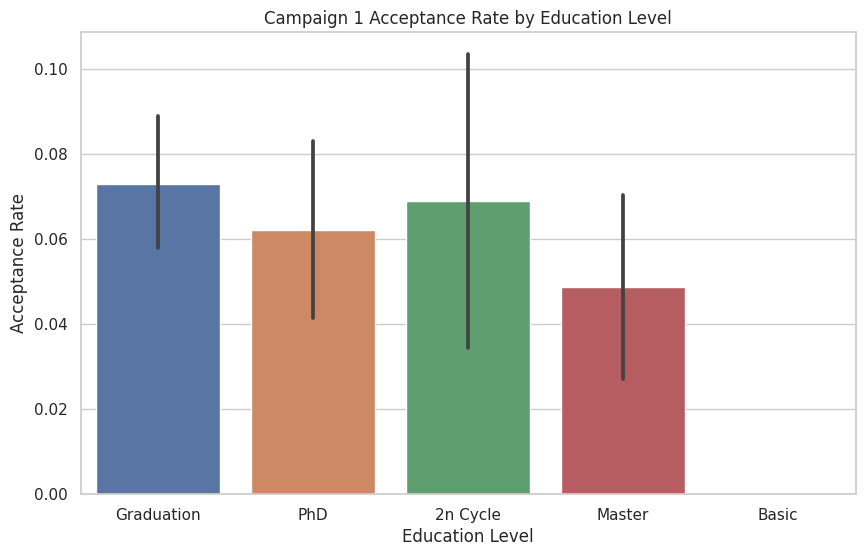

In [ ]:
# Calculate the overall acceptance rate for each marketing campaign (AcceptedCmp1 to AcceptedCmp5)
campaigns = ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5']
campaign_acceptance_rates = df[campaigns].mean()

# Print the overall acceptance rates for each campaign
print("Overall Acceptance Rate for Each Marketing Campaign:")
print(campaign_acceptance_rates)

# Explore differences in campaign acceptance based on customer demographics or behavior
# Example: Calculate acceptance rates by education level (Education)
education_acceptance_rates = df.groupby('Education')[campaigns].mean()

# Print the acceptance rates by education level
print("\nAcceptance Rates by Education Level:")
print(education_acceptance_rates)

# Visualize acceptance rates by education level (example)
plt.figure(figsize=(10, 6))
sns.barplot(x='Education', y='AcceptedCmp1', data=df)
plt.title('Campaign 1 Acceptance Rate by Education Level')
plt.xlabel('Education Level')
plt.ylabel('Acceptance Rate')
plt.show()


Proportion of Customers Who Complained in the Last 2 Years:
0.94%

Campaign Acceptance Rate for Customers Who Complained and Those Who Didn't:
Complain
0    0.149706
1    0.142857
Name: Response, dtype: float64


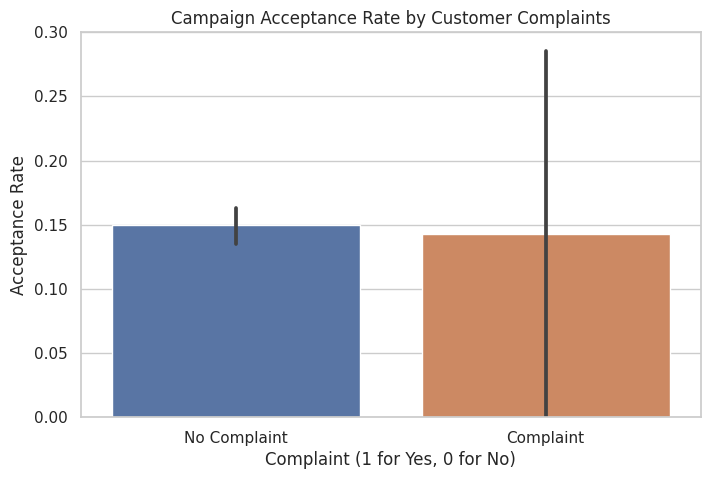

In [ ]:
# What is the proportion of customers who complained in the last 2 years (Complain)?
complaint_proportion = df['Complain'].mean()

# Print the proportion of customers who complained
print("Proportion of Customers Who Complained in the Last 2 Years:")
print(f"{complaint_proportion:.2%}")

# Is there any relationship between customer complaints and campaign acceptance?
# Calculate the acceptance rate for customers who complained and those who didn't
complaint_acceptance_rates = df.groupby('Complain')['Response'].mean()

# Print the acceptance rates for customers who complained and those who didn't
print("\nCampaign Acceptance Rate for Customers Who Complained and Those Who Didn't:")
print(complaint_acceptance_rates)

# Visualize the relationship between customer complaints and campaign acceptance
plt.figure(figsize=(8, 5))
sns.barplot(x='Complain', y='Response', data=df)
plt.title('Campaign Acceptance Rate by Customer Complaints')
plt.xlabel('Complaint (1 for Yes, 0 for No)')
plt.ylabel('Acceptance Rate')
plt.xticks([0, 1], ['No Complaint', 'Complaint'])
plt.show()


In [ ]:
# Create a new feature 'Total_Spending' by summing spending across all product categories
spending_cols = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
df['Total_Spending'] = df[spending_cols].sum(axis=1)

# Create a new feature 'Has_Children' to indicate if the customer has children at home
df['Has_Children'] = (df['Kidhome'] > 0) | (df['Teenhome'] > 0)

# Create interaction features between 'Income' and spending categories
for col in spending_cols:
    df[f'Income_{col}_Interaction'] = df['Income'] * df[col]

# Calculate the average enrollment duration (in years) up to the cutoff date
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'])
df['Enrollment_Duration'] = (cutoff_date - df['Dt_Customer']).dt.days / 365

# Print the DataFrame with the added 'Enrollment_Duration' column
print(df[['ID', 'Dt_Customer', 'Enrollment_Duration']])



         ID Dt_Customer  Enrollment_Duration
0      1826  2014-06-16             0.542466
1         1  2014-06-15             0.545205
2     10476  2014-05-13             0.635616
3      1386  2014-05-11             0.641096
4      5371  2014-04-08             0.731507
...     ...         ...                  ...
2227  10142  2013-03-07             1.819178
2228   5263  2013-01-22             1.939726
2229     22  2012-12-03             2.076712
2230    528  2012-11-29             2.087671
2231   4070  2012-09-01             2.331507

[2232 rows x 3 columns]


In [ ]:
# Print the updated DataFrame with new features
print(df.head())


      ID  Year_Birth   Education Marital_Status   Income  Kidhome  Teenhome  \
0   1826        1970  Graduation       Divorced  84835.0        0         0   
1      1        1961  Graduation         Single  57091.0        0         0   
2  10476        1958  Graduation        Married  67267.0        0         1   
3   1386        1967  Graduation       Together  32474.0        1         1   
4   5371        1989  Graduation         Single  21474.0        1         0   

  Dt_Customer  Recency  MntWines  ...    Country  Total_Spending  \
0  2014-06-16        0       189  ...      Spain            1190   
1  2014-06-15        0       464  ...     Canada             577   
2  2014-05-13        0       134  ...        USA             251   
3  2014-05-11        0        10  ...  Australia              11   
4  2014-04-08        0         6  ...      Spain              91   

   Has_Children  Income_MntWines_Interaction  Income_MntFruits_Interaction  \
0         False                   1603

In [ ]:
# Calculate the number of unique values for each column
unique_counts = df.nunique()

# Print the number of unique values for each column
print("Number of Unique Values for Each Column:")
print(unique_counts)


Number of Unique Values for Each Column:
ID                                     2232
Year_Birth                               59
Education                                 5
Marital_Status                            8
Income                                 1967
Kidhome                                   3
Teenhome                                  3
Dt_Customer                             663
Recency                                 100
MntWines                                776
MntFruits                               158
MntMeatProducts                         556
MntFishProducts                         182
MntSweetProducts                        177
MntGoldProds                            213
NumDealsPurchases                        15
NumWebPurchases                          15
NumCatalogPurchases                      13
NumStorePurchases                        14
NumWebVisitsMonth                        16
AcceptedCmp3                              2
AcceptedCmp4                       

In [ ]:
# Iterate through columns and print unique values
for column in df.columns:
    unique_values = df[column].unique()
    print(f"Unique values in '{column}':")
    print(unique_values)
    print("\n")


Unique values in 'ID':
[ 1826     1 10476 ...    22   528  4070]


Unique values in 'Year_Birth':
[1970 1961 1958 1967 1989 1954 1947 1979 1959 1981 1969 1977 1960 1966
 1976 1965 1956 1975 1971 1986 1972 1974 1990 1987 1984 1968 1955 1983
 1973 1978 1952 1962 1964 1982 1963 1957 1980 1945 1949 1948 1953 1946
 1985 1992 1944 1951 1988 1950 1994 1993 1991 1893 1996 1995 1899 1943
 1941 1940 1900]


Unique values in 'Education':
['Graduation' 'PhD' '2n Cycle' 'Master' 'Basic']


Unique values in 'Marital_Status':
['Divorced' 'Single' 'Married' 'Together' 'Widow' 'YOLO' 'Alone' 'Absurd']


Unique values in 'Income':
[84835. 57091. 67267. ... 46310. 65819. 94871.]


Unique values in 'Kidhome':
[0 1 2]


Unique values in 'Teenhome':
[0 1 2]


Unique values in 'Dt_Customer':
['2014-06-16T00:00:00.000000000' '2014-06-15T00:00:00.000000000'
 '2014-05-13T00:00:00.000000000' '2014-05-11T00:00:00.000000000'
 '2014-04-08T00:00:00.000000000' '2014-03-17T00:00:00.000000000'
 '2014-01-29T00:00:00.000

Distribution of Customers Across Different Countries:
Spain           1092
Saudi Arabia     335
Canada           267
Australia        160
India            147
Germany          120
USA              108
Mexico             3
Name: Country, dtype: int64

Average Spending by Country:
Country
Australia        561.018750
Canada           631.176030
Germany          624.275000
India            529.775510
Mexico          1040.666667
Saudi Arabia     624.713433
Spain            606.271062
USA              612.638889
Name: Total_Spending, dtype: float64

Average Campaign Acceptance Rate by Country:
Country
Australia       0.143750
Canada          0.142322
Germany         0.141667
India           0.088435
Mexico          0.666667
Saudi Arabia    0.155224
Spain           0.161172
USA             0.120370
Name: Response, dtype: float64


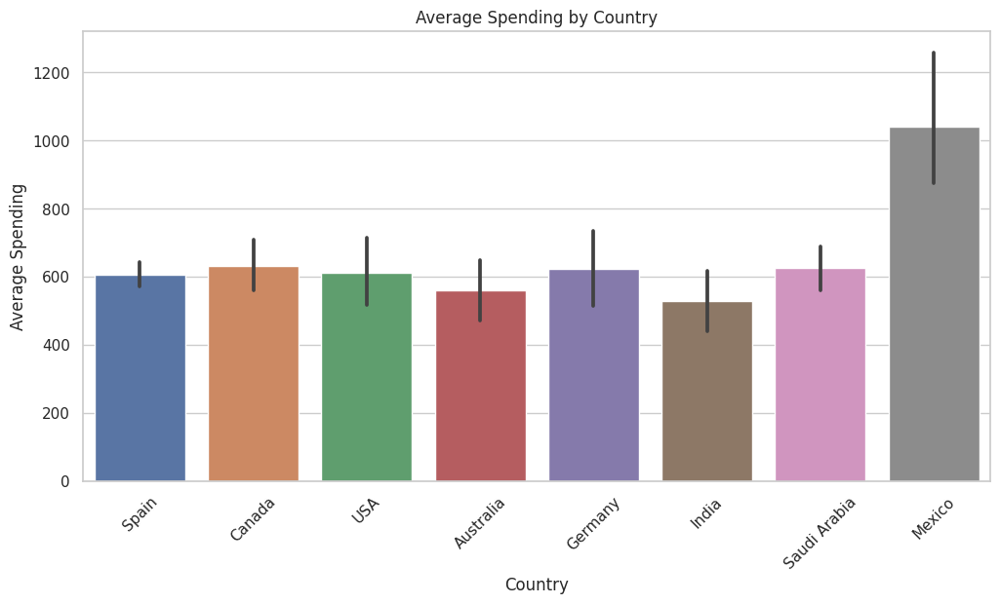

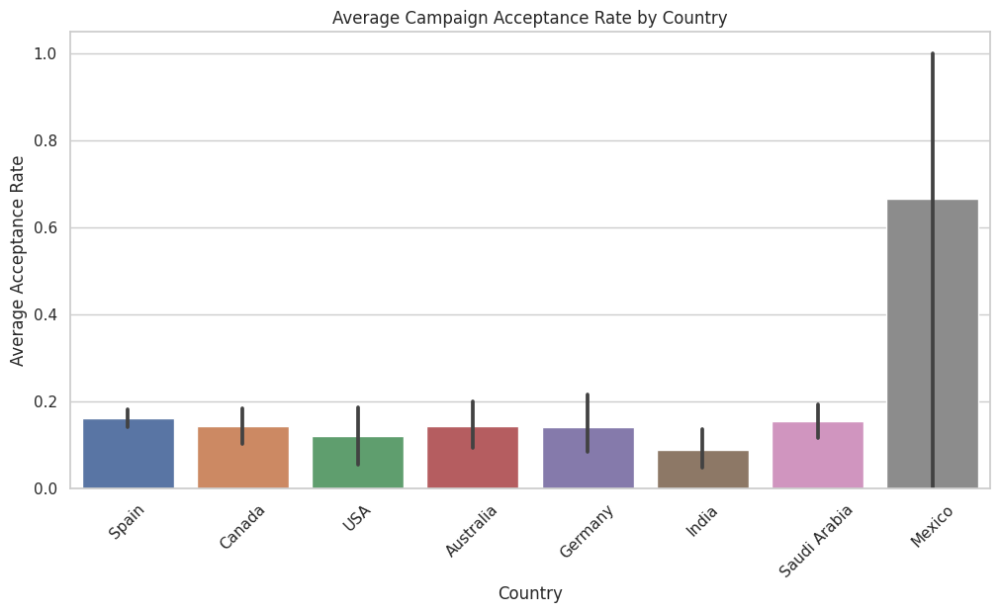

In [ ]:
# How are customers distributed across different countries (Country)?
country_distribution = df['Country'].value_counts()

# Print the distribution of customers by country
print("Distribution of Customers Across Different Countries:")
print(country_distribution)

# Do customer behaviors and campaign responses vary by country?
# Calculate average spending by country
average_spending_by_country = df.groupby('Country')['Total_Spending'].mean()

# Calculate average campaign acceptance rate by country
average_acceptance_by_country = df.groupby('Country')['Response'].mean()

# Print the results
print("\nAverage Spending by Country:")
print(average_spending_by_country)

print("\nAverage Campaign Acceptance Rate by Country:")
print(average_acceptance_by_country)

# Visualize customer behaviors and campaign responses by country (examples)
plt.figure(figsize=(12, 6))
sns.barplot(x='Country', y='Total_Spending', data=df)
plt.title('Average Spending by Country')
plt.xlabel('Country')
plt.ylabel('Average Spending')
plt.xticks(rotation=45)

plt.figure(figsize=(12, 6))
sns.barplot(x='Country', y='Response', data=df)
plt.title('Average Campaign Acceptance Rate by Country')
plt.xlabel('Country')
plt.ylabel('Average Acceptance Rate')
plt.xticks(rotation=45)

plt.show()


Average Time Since Last Purchase (Recency):
49.11 days

Campaign Acceptance Rate by Recency:
Recency
0     0.250000
1     0.375000
2     0.357143
3     0.310345
4     0.148148
        ...   
95    0.052632
96    0.120000
97    0.100000
98    0.095238
99    0.058824
Name: Response, Length: 100, dtype: float64


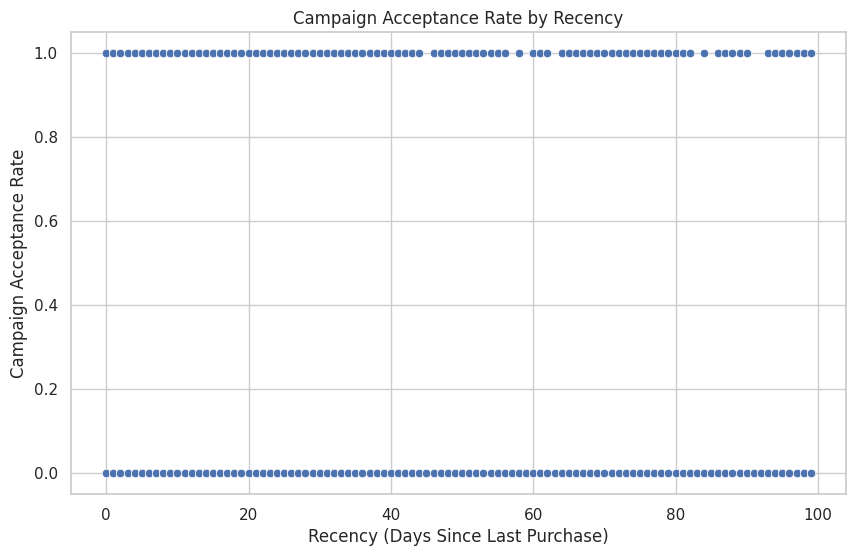

In [ ]:
# How recently did customers make their last purchase (Recency)?
average_recency = df['Recency'].mean()

# Print the average recency (time since last purchase)
print("Average Time Since Last Purchase (Recency):")
print(f"{average_recency:.2f} days")

# Are customers who made recent purchases more likely to accept marketing campaigns?
# Calculate the average campaign acceptance rate for different recency periods
recency_acceptance_rates = df.groupby('Recency')['Response'].mean()

# Print the acceptance rates for different recency periods
print("\nCampaign Acceptance Rate by Recency:")
print(recency_acceptance_rates)

# Visualize the relationship between recency and campaign acceptance (example)
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Recency', y='Response', data=df)
plt.title('Campaign Acceptance Rate by Recency')
plt.xlabel('Recency (Days Since Last Purchase)')
plt.ylabel('Campaign Acceptance Rate')
plt.show()


In [ ]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,Country,Total_Spending,Has_Children,Income_MntWines_Interaction,Income_MntFruits_Interaction,Income_MntMeatProducts_Interaction,Income_MntFishProducts_Interaction,Income_MntSweetProducts_Interaction,Income_MntGoldProds_Interaction,Enrollment_Duration
0,1826,1970,Graduation,Divorced,84835.0,0,0,2014-06-16,0,189,...,Spain,1190,False,16033815.0,8822840.0,32152465.0,9416685.0,16033815.0,18494030.0,0.542466
1,1,1961,Graduation,Single,57091.0,0,0,2014-06-15,0,464,...,Canada,577,False,26490224.0,285455.0,3653824.0,399637.0,0.0,2112367.0,0.545205
2,10476,1958,Graduation,Married,67267.0,0,1,2014-05-13,0,134,...,USA,251,True,9013778.0,739937.0,3968753.0,1009005.0,134534.0,2018010.0,0.635616
3,1386,1967,Graduation,Together,32474.0,1,1,2014-05-11,0,10,...,Australia,11,True,324740.0,0.0,32474.0,0.0,0.0,0.0,0.641096
4,5371,1989,Graduation,Single,21474.0,1,0,2014-04-08,0,6,...,Spain,91,True,128844.0,343584.0,515376.0,236214.0,0.0,730116.0,0.731507
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2227,10142,1976,PhD,Divorced,66476.0,0,1,2013-03-07,99,372,...,USA,689,True,24729072.0,1196568.0,8375976.0,3124372.0,3190848.0,5185128.0,1.819178
2228,5263,1977,2n Cycle,Married,31056.0,1,0,2013-01-22,99,5,...,Spain,55,True,155280.0,310560.0,403728.0,93168.0,248448.0,496896.0,1.939726
2229,22,1976,Graduation,Divorced,46310.0,1,0,2012-12-03,99,185,...,Spain,309,True,8567350.0,92620.0,4075280.0,694650.0,231550.0,648340.0,2.076712
2230,528,1978,Graduation,Married,65819.0,0,0,2012-11-29,99,267,...,India,1383,False,17573673.0,2501122.0,46139119.0,9807031.0,10860135.0,4146597.0,2.087671


In [ ]:
df_copied = df.copy()

In [ ]:
df = df_copied.copy()

In [ ]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,Country,Total_Spending,Has_Children,Income_MntWines_Interaction,Income_MntFruits_Interaction,Income_MntMeatProducts_Interaction,Income_MntFishProducts_Interaction,Income_MntSweetProducts_Interaction,Income_MntGoldProds_Interaction,Enrollment_Duration
0,1826,1970,Graduation,Divorced,84835.0,0,0,2014-06-16,0,189,...,Spain,1190,False,16033815.0,8822840.0,32152465.0,9416685.0,16033815.0,18494030.0,0.542466
1,1,1961,Graduation,Single,57091.0,0,0,2014-06-15,0,464,...,Canada,577,False,26490224.0,285455.0,3653824.0,399637.0,0.0,2112367.0,0.545205
2,10476,1958,Graduation,Married,67267.0,0,1,2014-05-13,0,134,...,USA,251,True,9013778.0,739937.0,3968753.0,1009005.0,134534.0,2018010.0,0.635616
3,1386,1967,Graduation,Together,32474.0,1,1,2014-05-11,0,10,...,Australia,11,True,324740.0,0.0,32474.0,0.0,0.0,0.0,0.641096
4,5371,1989,Graduation,Single,21474.0,1,0,2014-04-08,0,6,...,Spain,91,True,128844.0,343584.0,515376.0,236214.0,0.0,730116.0,0.731507
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2227,10142,1976,PhD,Divorced,66476.0,0,1,2013-03-07,99,372,...,USA,689,True,24729072.0,1196568.0,8375976.0,3124372.0,3190848.0,5185128.0,1.819178
2228,5263,1977,2n Cycle,Married,31056.0,1,0,2013-01-22,99,5,...,Spain,55,True,155280.0,310560.0,403728.0,93168.0,248448.0,496896.0,1.939726
2229,22,1976,Graduation,Divorced,46310.0,1,0,2012-12-03,99,185,...,Spain,309,True,8567350.0,92620.0,4075280.0,694650.0,231550.0,648340.0,2.076712
2230,528,1978,Graduation,Married,65819.0,0,0,2012-11-29,99,267,...,India,1383,False,17573673.0,2501122.0,46139119.0,9807031.0,10860135.0,4146597.0,2.087671


In [ ]:
# Select the categorical columns to label encode
categorical_cols = df.select_dtypes(exclude=['number']).columns.tolist()

# Initialize a LabelEncoder
label_encoder = LabelEncoder()

# Create a dictionary to store the mapping of categorical values to encoded values
encoding_mapping = {}

# Apply label encoding to each categorical column, store the mapping, and replace the original columns
for col in categorical_cols:
    df[col] = label_encoder.fit_transform(df[col])
    encoding_mapping[col] = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))

# Print the first few rows of the DataFrame with label encoding applied
print(df.head())

# Print the encoding mapping for each categorical column
for col, mapping in encoding_mapping.items():
    print(f"Encoding Mapping for '{col}':")
    print(mapping)


      ID  Year_Birth  Education  Marital_Status   Income  Kidhome  Teenhome  \
0   1826        1970          2               2  84835.0        0         0   
1      1        1961          2               4  57091.0        0         0   
2  10476        1958          2               3  67267.0        0         1   
3   1386        1967          2               5  32474.0        1         1   
4   5371        1989          2               4  21474.0        1         0   

   Dt_Customer  Recency  MntWines  ...  Country  Total_Spending  Has_Children  \
0          649        0       189  ...        6            1190             0   
1          648        0       464  ...        1             577             0   
2          619        0       134  ...        7             251             1   
3          617        0        10  ...        0              11             1   
4          584        0         6  ...        6              91             1   

   Income_MntWines_Interaction  Income

In [ ]:
# Print the first few rows of the DataFrame with label encoding applied
print(df.head())


      ID  Year_Birth  Education  Marital_Status   Income  Kidhome  Teenhome  \
0   1826        1970          2               2  84835.0        0         0   
1      1        1961          2               4  57091.0        0         0   
2  10476        1958          2               3  67267.0        0         1   
3   1386        1967          2               5  32474.0        1         1   
4   5371        1989          2               4  21474.0        1         0   

   Dt_Customer  Recency  MntWines  ...  Country  Total_Spending  Has_Children  \
0          649        0       189  ...        6            1190             0   
1          648        0       464  ...        1             577             0   
2          619        0       134  ...        7             251             1   
3          617        0        10  ...        0              11             1   
4          584        0         6  ...        6              91             1   

   Income_MntWines_Interaction  Income

In [ ]:
# Separate the target variable (Response) from the features
X = df.drop(columns=['Response'])
y = df['Response']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize a RandomForestClassifier for feature importance
clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the model on the training data
clf.fit(X_train, y_train)

# Calculate feature importance scores
feature_importances = clf.feature_importances_

# Create a DataFrame to store feature names and their importance scores
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

# Sort features by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Print the sorted feature importance scores
print("Feature Importance Scores:")
print(feature_importance_df)

# Select important features using a threshold (e.g., top 50% of features)
num_selected_features = int(len(X.columns) * 0.5)  # Adjust the threshold as needed
selected_features = feature_importance_df.head(num_selected_features)['Feature'].tolist()

# Create a new DataFrame with selected features
X_selected = X[selected_features]

# Use X_selected for modeling, or further analysis as needed


Feature Importance Scores:
                                Feature  Importance
8                               Recency    0.074264
29          Income_MntWines_Interaction    0.053979
7                           Dt_Customer    0.050523
9                              MntWines    0.047270
35                  Enrollment_Duration    0.047174
27                       Total_Spending    0.045230
4                                Income    0.044988
31   Income_MntMeatProducts_Interaction    0.040410
22                         AcceptedCmp5    0.038269
0                                    ID    0.037953
11                      MntMeatProducts    0.034711
14                         MntGoldProds    0.032127
34      Income_MntGoldProds_Interaction    0.030915
20                         AcceptedCmp3    0.030587
1                            Year_Birth    0.030518
32   Income_MntFishProducts_Interaction    0.027327
33  Income_MntSweetProducts_Interaction    0.026836
18                    NumStorePurchas

In [ ]:
X_selected

,Recency,Income_MntWines_Interaction,Dt_Customer,MntWines,Enrollment_Duration,Total_Spending,Income,Income_MntMeatProducts_Interaction,AcceptedCmp5,ID,MntMeatProducts,MntGoldProds,Income_MntGoldProds_Interaction,AcceptedCmp3,Year_Birth,Income_MntFishProducts_Interaction,Income_MntSweetProducts_Interaction,NumStorePurchases
0,0,16033815.0,649,189,0.542466,1190,84835.0,32152465.0,0,1826,379,218,18494030.0,0,1970,9416685.0,16033815.0,6
1,0,26490224.0,648,464,0.545205,577,57091.0,3653824.0,0,1,64,37,2112367.0,0,1961,399637.0,0.0,7
2,0,9013778.0,619,134,0.635616,251,67267.0,3968753.0,0,10476,59,30,2018010.0,0,1958,1009005.0,134534.0,5
3,0,324740.0,617,10,0.641096,11,32474.0,32474.0,0,1386,1,0,0.0,0,1967,0.0,0.0,2
4,0,128844.0,584,6,0.731507,91,21474.0,515376.0,0,5371,24,34,730116.0,1,1989,236214.0,0.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2227,99,24729072.0,209,372,1.819178,689,66476.0,8375976.0,0,10142,126,78,5185128.0,0,1976,3124372.0,3190848.0,11
2228,99,155280.0,169,5,1.939726,55,31056.0,403728.0,0,5263,13,16,496896.0,0,1977,93168.0,248448.0,3
2229,99,8567350.0,121,185,2.076712,309,46310.0,4075280.0,0,22,88,14,648340.0,0,1976,694650.0,231550.0,5
2230,99,17573673.0,117,267,2.087671,1383,65819.0,46139119.0,0,528,701,63,4146597.0,0,1978,9807031.0,10860135.0,10


In [ ]:
# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X_selected, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Initialize regression models
models = [
    ('Linear Regression', LinearRegression()),
    ('Lasso Regression', Lasso()),
    ('Ridge Regression', Ridge()),
    ('Decision Tree', DecisionTreeRegressor()),
    ('Random Forest', RandomForestRegressor())
]

# Evaluate models using cross-validation on the training data
results = []
for name, model in models:
    scores = cross_val_score(model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
    rmse_scores = np.sqrt(-scores)
    results.append((name, rmse_scores.mean(), rmse_scores.std()))

# Print the cross-validation results
print("Cross-validation results (RMSE):")
for name, mean_score, std_score in results:
    print(f"{name}: Mean RMSE = {mean_score:.4f}, Std RMSE = {std_score:.4f}")

# Select the best model based on cross-validation results
best_model_name = min(results, key=lambda x: x[1])[0]
best_model = next(model for model_name, model in models if model_name == best_model_name)

# Train the best model on the training set
best_model.fit(X_train, y_train)

# Validate the best model on the validation set
y_val_pred = best_model.predict(X_val)
val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
print(f"\nValidation RMSE for the best model ({best_model_name}): {val_rmse:.4f}")



/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.98419e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=7.27581e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=7.18077e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.92893e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarnin

Cross-validation results (RMSE):
Linear Regression: Mean RMSE = 0.3064, Std RMSE = 0.0172
Lasso Regression: Mean RMSE = 0.3260, Std RMSE = 0.0145
Ridge Regression: Mean RMSE = 0.3064, Std RMSE = 0.0182
Decision Tree: Mean RMSE = 0.3964, Std RMSE = 0.0185
Random Forest: Mean RMSE = 0.3042, Std RMSE = 0.0160

Validation RMSE for the best model (Random Forest): 0.2971


In [ ]:
# Define hyperparameter search space for RandomForestRegressor
param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Initialize RandomForestRegressor
rf_model = RandomForestRegressor(random_state=42)

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    rf_model, param_distributions=param_dist, n_iter=100, cv=5, scoring='neg_mean_squared_error', random_state=42, n_jobs=-1
)

# Fit RandomizedSearchCV on training data
random_search.fit(X_train, y_train)

# Get the best hyperparameters
best_hyperparams = random_search.best_params_

# Train the best model with optimized hyperparameters on the training set
best_model_optimized = random_search.best_estimator_
best_model_optimized.fit(X_train, y_train)

# Validate the best model with optimized hyperparameters on the validation set
y_val_pred_optimized = best_model_optimized.predict(X_val)
val_rmse_optimized = np.sqrt(mean_squared_error(y_val, y_val_pred_optimized))
print(f"\nValidation RMSE for the best model with optimized hyperparameters ({best_model_name}): {val_rmse_optimized:.4f}")

# Evaluate the best model with optimized hyperparameters on the test set (unseen data)
y_test_pred_optimized = best_model_optimized.predict(X_test)
test_rmse_optimized = np.sqrt(mean_squared_error(y_test, y_test_pred_optimized))
print(f"\nTest RMSE for the best model with optimized hyperparameters ({best_model_name}): {test_rmse_optimized:.4f}")



Validation RMSE for the best model with optimized hyperparameters (Random Forest): 0.2993

Test RMSE for the best model with optimized hyperparameters (Random Forest): 0.3324


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Calculate Mean Absolute Error (MAE) for validation set
val_mae_optimized = mean_absolute_error(y_val, y_val_pred_optimized)
print(f"Validation MAE for the best model with optimized hyperparameters: {val_mae_optimized:.4f}")

# Evaluate the best model with optimized hyperparameters on the test set (unseen data)
y_test_pred_optimized = best_model_optimized.predict(X_test)
test_rmse_optimized = np.sqrt(mean_squared_error(y_test, y_test_pred_optimized))
print(f"\nTest RMSE for the best model with optimized hyperparameters: {test_rmse_optimized:.4f}")

# Calculate Mean Absolute Error (MAE) for test set
test_mae_optimized = mean_absolute_error(y_test, y_test_pred_optimized)
print(f"Test MAE for the best model with optimized hyperparameters: {test_mae_optimized:.4f}")

Validation MAE for the best model with optimized hyperparameters: 0.1850

Test RMSE for the best model with optimized hyperparameters: 0.3324
Test MAE for the best model with optimized hyperparameters: 0.2137


In [ ]:
# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X_selected, y, test_size=0.3, random_state=42)
X_valid, X_test, y_valid, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Model Selection (Random Forest Classifier as an example)
rf_classifier = RandomForestClassifier(random_state=42)

# Hyperparameter Tuning using Randomized Search
param_dist = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

random_search = RandomizedSearchCV(estimator=rf_classifier, param_distributions=param_dist, cv=5, scoring='accuracy', n_jobs=-1)
random_search.fit(X_train, y_train)

# Get the best hyperparameters from the random search
best_params = random_search.best_params_

# Train the final model with the best hyperparameters
best_rf_classifier = RandomForestClassifier(random_state=42, **best_params)
best_rf_classifier.fit(X_train, y_train)

# Model Evaluation
# Validate the model on the validation set
y_valid_pred = best_rf_classifier.predict(X_valid)
valid_accuracy = accuracy_score(y_valid, y_valid_pred)
print(f"Validation Set Accuracy: {valid_accuracy:.2f}")

# Cross-Validation for Model Generalization
cv_scores = cross_val_score(best_rf_classifier, X_train, y_train, cv=5)
print(f"Cross-Validation Scores: {cv_scores}")
print(f"Mean CV Accuracy: {np.mean(cv_scores):.2f}")

# Test the final model on the test set
y_test_pred = best_rf_classifier.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Set Accuracy: {test_accuracy:.2f}")


Validation Set Accuracy: 0.88
Cross-Validation Scores: [0.86900958 0.8913738  0.875      0.88782051 0.89423077]
Mean CV Accuracy: 0.88
Test Set Accuracy: 0.82
